In [ ]:
# !unzip dataset_strw_vs_pear.zip

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
# import idx2numpy
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets
from PIL import Image
from tqdm.notebook import tqdm
from torch.utils.tensorboard import SummaryWriter
import tempfile
import torchvision.models as models
import torchvision
from torch.optim import lr_scheduler
import time
import copy
from google.colab import drive
import matplotlib.image as mpimg
from PIL import Image
drive.mount("/content/gdrive")
import os

Mounted at /content/gdrive


In [ ]:
class VGG_1b(nn.Module):
    def __init__(self):
        super(VGG_1b, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.fc1 = nn.Linear(320000, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, 2)

    def forward(self, x):
        # print('hi')
        # print(x.shape)
        x = nn.functional.relu(self.conv1(x))
        x = nn.functional.max_pool2d(x, 2)
        x = x.view(x.size(0), -1)
        x = nn.functional.relu(self.fc1(x))
        x = nn.functional.dropout(x, p=0.5, training=self.training)
        x = nn.functional.relu(self.fc2(x))
        x = nn.functional.dropout(x, p=0.5, training=self.training)
        x = self.fc3(x)
        return x


In [ ]:
class VGG(nn.Module):
    def __init__(self):
        super(VGG, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=3)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=3)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=3)
        self.fc1 = nn.Linear(100352, 1024)
        self.fc2 = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 2)

    def forward(self, x):

        x = nn.functional.relu(self.conv1(x))
        x = nn.functional.max_pool2d(x, 2)
        x = nn.functional.relu(self.conv2(x))
        x = nn.functional.max_pool2d(x, 2)
        x = nn.functional.relu(self.conv3(x))
        x = nn.functional.max_pool2d(x, 2)
        x = x.view(x.size(0), -1)
        x = nn.functional.relu(self.fc1(x))
        x = nn.functional.dropout(x, p=0.5, training=self.training)
        x = nn.functional.relu(self.fc2(x))
        x = nn.functional.dropout(x, p=0.5, training=self.training)
        x = self.fc3(x)
        return x


In [ ]:
class FeedForwardNetwork(nn.Module):
    """layerwise_hidden_dims is a list of hidden dimension size in consecutive layers. layerwise_activations is a list that stores the activation function to be used after each layer."""
    def __init__(self, input_size, output_size, layerwise_hidden_dims, layerwise_activations):
        super(FeedForwardNetwork, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(input_size, layerwise_hidden_dims[0]),
            layerwise_activations(),
            nn.Linear(layerwise_hidden_dims[0], layerwise_hidden_dims[1]),
            layerwise_activations(),
            nn.Linear(layerwise_hidden_dims[1], output_size)
        )

    def forward(self, x):
        x = self.flatten(x)
#         print(x, x.shape)
#         x = x.view(-1, 3*28*28)
        logits = self.linear_relu_stack(x)
        return logits

In [ ]:
def train(train_dataloader, test_dataloader, model, criterion, optimizer, device, writer, epochs=10, model_str="VGG3"):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    no_of_steps = 0
    no_of_batches = len(train_dataloader)
    size = len(train_dataloader.dataset)
    model.train()
    for epoch in tqdm(range(epochs), desc="Epochs"):
        running_loss, total_loss, correct = 0.0, 0.0, 0
        for i, data in enumerate(train_dataloader, 0):
            inputs, labels = data[0].to(device), data[1].type(torch.LongTensor).to(device)
            optimizer.zero_grad()
            
            outputs = model(inputs.cuda())

            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            cur_loss = loss.item()
            running_loss += cur_loss
            total_loss += cur_loss
            no_of_steps += 1

            correct += (outputs.argmax(1) == labels).type(torch.float).sum().item()
            writer.add_scalar(f'Training Loss VS Iteration', loss, no_of_steps)
            
            ##########Train Accuracy for each iteration###########
            # model.eval()
            # loc_correct = 0
            # with torch.no_grad():
            #     for j, data_ in enumerate(train_dataloader, 0):
            #         inputs_, labels_ = data_[0].to(device), data_[1].type(torch.LongTensor).to(device)
            #         pred_ = model(inputs_)
            #         loc_correct += (pred_.argmax(1) == labels_).type(torch.float).sum().item()

            # loc_correct /= size
            # writer.add_scalar('Training Accuracy VS Iteration', 100*loc_correct, no_of_steps)
            # model.train()            


        total_loss /= no_of_batches
        correct /= size
        writer.add_scalar('Training Accuracy VS Epoch', 100*correct, epoch)
        writer.add_scalar('Avg Training Loss VS Epoch', total_loss, epoch) 
        print(f'Epoch:{epoch} | Training Accuracy:{100*correct} | Training Loss:{total_loss}')

        model.eval()
        loc_correct = 0
        with torch.no_grad():
            for j, data_ in enumerate(test_dataloader, 0):
                inputs_, labels_ = data_[0].to(device), data_[1].type(torch.LongTensor).to(device)
                pred_ = model(inputs_)
                loc_correct += (pred_.argmax(1) == labels_).type(torch.float).sum().item()

        loc_correct /= size
        writer.add_scalar('Test Accuracy VS Epoch', 100*loc_correct, no_of_steps)
        model.train() 
    
    print()
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    # model.load_state_dict(best_model_wts)
    return model



In [ ]:
def test(test_dataloader, model, loss_fn, device, writer, model_str="VGG3"):

    size = len(test_dataloader.dataset)
    num_batches = len(test_dataloader)
    model.eval()
    test_loss, correct = 0, 0
    count = 0
    with torch.no_grad():
        for i, data in enumerate(test_dataloader, 0):
            inputs, labels = data[0].to(device), data[1].type(torch.LongTensor).to(device)
#             X = torch.mean(X, 1)
            pred = model(inputs)
            test_loss += loss_fn(pred, labels).item()
            correct += (pred.argmax(1) == labels).type(torch.float).sum().item()
            # writer.add_scalar(f'Test Accuracy VS Step', correct, epoch*(num_batches)+count)
            count += 1 
    test_loss /= num_batches
    correct /= size
    print(f"Test Error: \n Accuracy: {100*(correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")

In [ ]:
# Write the custom Dataset class here
class CustomImageDataset(Dataset):
    # image_path = '/content/train-images-idx3-ubyte' label_path='/content/train-labels-idx1-ubyte'
    def __init__(self, image_path, label_path, transform=None):

        self.images = np.load(image_path)
        self.labels = np.load(label_path)
        self.transform = transform

    def __len__(self):
        return self.images.shape[0]

    def __getitem__(self, idx):

        image_array = self.images[idx]
        label = self.labels[idx]
        image_array = image_array[:3]
        return image_array, label

In [ ]:
def get_tranforms(data_aug):
    
    train_transforms = transforms.Compose([
        transforms.Resize(200),
        transforms.CenterCrop(200),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        # transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])

    test_transforms = transforms.Compose([
        transforms.Resize(200),
        transforms.CenterCrop(200),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        # transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    # data_aug = False

    # if data_aug:
    #     train_transforms = transforms.Compose([transforms.RandomRotation(30),
    #                                        transforms.RandomResizedCrop(200),
    #                                        transforms.RandomHorizontalFlip(),
    #                                        transforms.ToTensor(),
    #                                        transforms.Normalize([0.5, 0.5, 0.5], 
    #                                                             [0.5, 0.5, 0.5])])
    return train_transforms, test_transforms

In [ ]:
# training_data = CustomImageDataset(
#     'train_data.npy', 'train_label.npy', transform)
# testing_data = CustomImageDataset('test_data.npy', 'test_label.npy', transform)
def get_loader(model_str):
  data_aug = False
  train_transforms, test_transforms = get_tranforms(data_aug)
  data_dir = '/content/gdrive/My Drive/dataset_strw_vs_pear'
  if model_str =='VGG3_aug':
    data_dir = '/content/gdrive/My Drive/dataset_strw_vs_pear_aug'
    print("Augmented Dataset Taken")

  training_data = datasets.ImageFolder(data_dir + '/train',  
                                      transform=train_transforms)                                       
  testing_data = datasets.ImageFolder(data_dir + '/test', 
                                      transform=test_transforms)

  train_dataloader = DataLoader(training_data, batch_size=32, shuffle=True)
  test_dataloader = DataLoader(testing_data, batch_size=32, shuffle=True)

  return train_dataloader, test_dataloader

In [ ]:

def model_init(model_str, writer):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  model = VGG().to(device)

  input_size = 120000#200 * 200 *3
  output_size = 2
  layerwise_hidden_dims = [10*10, 5*5]
  layerwise_activations = nn.ReLU

  # model_str = "VGG3"
  criterion = nn.CrossEntropyLoss()
  if model_str == "VGG3":
    model = VGG().to(device)
  elif model_str == "VGG1":
    model = VGG_1b().to(device)
  elif model_str == "VGG3_aug":
    model = VGG().to(device)
    pass
  elif model_str == "VGG16":
    model = models.vgg16(pretrained=True).to(device)
    mod = list(model.classifier.children())
    mod.pop()
    mod.append(torch.nn.Linear(4096, 2))
    new_classifier = torch.nn.Sequential(*mod)
    model.classifier = new_classifier.cuda()
  elif model_str == "MLP":
    model = FeedForwardNetwork(input_size, output_size, 
                              layerwise_hidden_dims, layerwise_activations).to(device)
  
  optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

  train_dataloader, test_dataloader = get_loader(model_str)
  
  model_trained = train(train_dataloader, test_dataloader, model, criterion, optimizer, device, writer, epochs=20, model_str=model_str)
  PATH = "./saved_models"
  # Create directory if it doesn't exist
  if not os.path.exists(PATH):
      os.makedirs(save_dir)
  # Save the model to the directory
  save_path = os.path.join(PATH, f"model_{model_str}.pt")
  torch.save(model.state_dict(), save_path)
  test(test_dataloader, model, criterion, device, writer, model_str=model_str)
  return model

In [ ]:
%load_ext tensorboard
!rm -rf ./logs/
# log_dir = tempfile.mkdtemp()   # requires a temp dir tpo store logs
%tensorboard --logdir runs  --reload_interval 1  ##reload log every 1 sec

<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard
m = "VGG3_aug"
model_name = f'/train/model_{m}'
writer = SummaryWriter(log_dir='runs/{}'.format("tensorboard") + model_name)

In [ ]:

model_trained = model_init(m, writer)



Augmented Dataset Taken


Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch:0 | Training Accuracy:56.875 | Training Loss:0.6899227619171142
Epoch:1 | Training Accuracy:62.18749999999999 | Training Loss:0.6803550601005555
Epoch:2 | Training Accuracy:70.3125 | Training Loss:0.6620032608509063
Epoch:3 | Training Accuracy:72.1875 | Training Loss:0.6291869759559632
Epoch:4 | Training Accuracy:74.6875 | Training Loss:0.5753769934177398
Epoch:5 | Training Accuracy:77.5 | Training Loss:0.4955546498298645
Epoch:6 | Training Accuracy:82.5 | Training Loss:0.41691515743732455
Epoch:7 | Training Accuracy:83.125 | Training Loss:0.3419691324234009
Epoch:8 | Training Accuracy:89.375 | Training Loss:0.28605455011129377
Epoch:9 | Training Accuracy:91.875 | Training Loss:0.2473684623837471
Epoch:10 | Training Accuracy:89.6875 | Training Loss:0.24689519554376602
Epoch:11 | Training Accuracy:93.125 | Training Loss:0.1973020188510418
Epoch:12 | Training Accuracy:92.8125 | Training Loss:0.19789443984627725
Epoch:13 | Training Accuracy:93.4375 | Training Loss:0.1766712397336959

In [ ]:
# testing_data.images.shape, testing_data.labels.shape, training_data.images.shape, training_data.labels.shape

In [ ]:
train_dataloader, test_dataloader = get_loader(m)


Augmented Dataset Taken


In [ ]:

test_dataloader.dataset.classes

['pear', 'strawberry']

In [ ]:
device = "cuda"
true_labels = []
pred_labels = []
image_list = []
size = len(test_dataloader.dataset)
num_batches = len(test_dataloader)
model_trained.eval()
test_loss, correct = 0, 0
count = 0
with torch.no_grad():
    for i, data in enumerate(test_dataloader, 0):
        inputs, labels = data[0].to(device), data[1].type(torch.LongTensor).to(device)
#             X = torch.mean(X, 1)
        pred = model_trained(inputs)
        # test_loss += loss_fn(pred, labels).item()
        correct += (pred.argmax(1) == labels).type(torch.float).sum().item()
        print(f'Label type:{type(labels)}, Pred argmax type: {type(pred.argmax(1))}, Input type:{type(inputs)}')
        for i in range(len(labels)):
          true_labels.append(labels[i])
          pred_labels.append(pred.argmax(1)[i])
          image_list.append(inputs[i])
          # print(labels)


Label type:<class 'torch.Tensor'>, Pred argmax type: <class 'torch.Tensor'>, Input type:<class 'torch.Tensor'>
Label type:<class 'torch.Tensor'>, Pred argmax type: <class 'torch.Tensor'>, Input type:<class 'torch.Tensor'>


In [ ]:
# true_labels[0].item()
# pred_labels[0].item()
# image_list[0].shape
print(len(image_list))
import matplotlib.image as mpimg
from PIL import Image
type(pred_labels[0].item())

40


int

In [ ]:
pred_labels[0]

tensor(1, device='cuda:0')

In [ ]:

import io

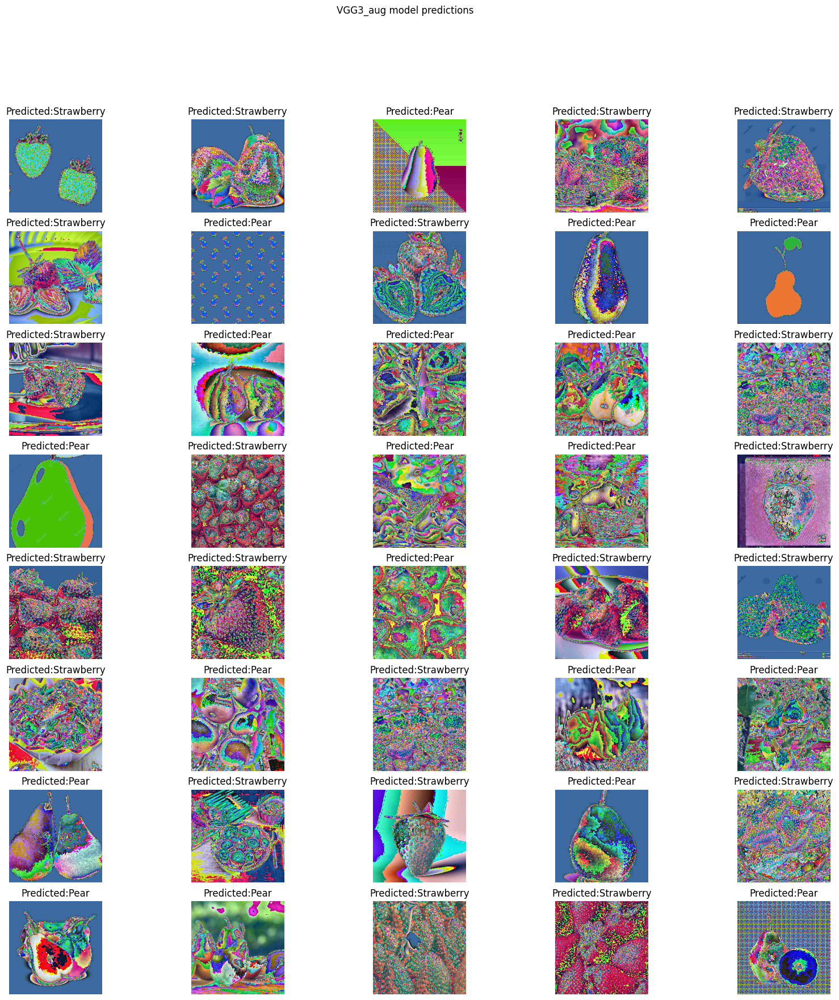

In [ ]:
fig, axs = plt.subplots(8, 5, figsize=(20, 20))
fig.suptitle(f'{m} model predictions')
# img = transform(tensor)
count = 0
img_tranform = transforms.ToPILImage()
for i in range(8):
  for j in range(5):
    axs[i, j].imshow(img_tranform(image_list[count]))
    pred_str = "Pear" if pred_labels[count].item() == 0 else "Strawberry"
    axs[i, j].set_title(f'Predicted:{pred_str}')
    axs[i, j].axis('off')
    count += 1

# buf = io.BytesIO()
# fig.savefig(buf, format='jpeg')
# buf.seek(0)



In [ ]:

writer.add_figure(f'{m} model predicted image', fig)

In [ ]:

def count_parameters(model):
    """
    Counts the total number of trainable parameters in a PyTorch model.
    """
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


In [ ]:
print(f"Total Parameters of model {m} are: {count_parameters{model_trained}}")

| |Training time | Training loss | Training accuracy | Testing accuracy | No of model parameters|
|-|--- | --- | --- | --- | --- |
|VGG (1 block)|  |   |  |  |  |
|VGG (3 blocks)|  |   |  |  |  |
|VGG (3 blocks) with data augmentation |  |   |  |  |  |
|Transfer learning using VGG16 or VGG19|  |   |  |  |  |